In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import os
sns.set()
from decodedoutputdefs import Precision, training_curve_indv, training_curve_average, getfiles #class with the compiled definitions

In [14]:
def testrecalltypes(base,bins = 20, full_files = [], printdf = False):
    if len(full_files) == 0:
        files = os.listdir(base)
        full_files = [base+f for f in files if 'Base.csv' in f]
    r1_all = []
    r2_all = []
    r3_all = []
    r4_all = []
    for f in full_files:
        df = pd.read_csv(f, sep = "\t")
        p = Precision()
        i = f.split('model')[1].split('_')[0]
        if 'sir2' in base:
            r1, r2 = p.err_recall_type(f, df = df)
            r1_all.append(len(r1))
            r2_all.append(len(r2))
            plt.figure()
            plt.hist(r1, bins = bins)
            plt.title('Recall 1, Model {}'.format(i))
            plt.xlim([-180,180])
            plt.figure()
            plt.hist(r2, bins = bins)
            plt.title('Recall 2, Model {}'.format(i))
            plt.xlim([-180,180])
            plt.figure()
            plt.bar([0,1], [np.mean(np.abs(r1)), np.mean(np.abs(r2))])
            plt.xticks([0,1],labels = ['Recall 1', 'Recall 2'])
            plt.title('Model {}'.format(i))
        if 'sir3' in base:
            r1, r2, r3 = p.err_recall_type_sir3(f, df = df)
            r1_all.append(len(r1))
            r2_all.append(len(r2))
            r3_all.append(len(r3))
            plt.figure()
            plt.hist(r1, bins = bins)
            plt.title('Recall 1, Model {}'.format(i))
            plt.xlim([-180,180])
            plt.figure()
            plt.hist(r2, bins = bins)
            plt.title('Recall 2, Model {}'.format(i))
            plt.xlim([-180,180])
            plt.figure()
            plt.hist(r3, bins = bins)
            plt.title('Recall 3, Model {}'.format(i))
            plt.xlim([-180,180])
            plt.figure()
            plt.bar([0,1,2], [np.mean(np.abs(r1)), np.mean(np.abs(r2)), np.mean(np.abs(r3))])
            plt.xticks([0,1,2],labels = ['Recall 1', 'Recall 2' ,'Recall 3'])
            plt.title('Model {}'.format(i))
        if 'sir4' in base:
            r1, r2, r3, r4 = p.err_recall_type_sir4(f, df = df)
            r1_all.append(len(r1))
            r2_all.append(len(r2))
            r3_all.append(len(r3))
            r4_all.append(len(r4))
            plt.figure()
            plt.hist(r1, bins = bins)
            plt.title('Recall 1, Model {}'.format(i))
            plt.xlim([-180,180])
            plt.figure()
            plt.hist(r2, bins = bins)
            plt.title('Recall 2, Model {}'.format(i))
            plt.xlim([-180,180])
            plt.figure()
            plt.hist(r3, bins = bins)
            plt.title('Recall 3, Model {}'.format(i))
            plt.xlim([-180,180])
            plt.figure()
            plt.hist(r4, bins = bins)
            plt.title('Recall 4, Model {}'.format(i))
            plt.xlim([-180,180])
            plt.figure()
            plt.bar([0,1,2, 3], [np.mean(np.abs(r1)), np.mean(np.abs(r2)), np.mean(np.abs(r3)), np.mean(np.abs(r4))])
            plt.xticks([0,1,2, 3],labels = ['Recall 1', 'Recall 2' ,'Recall 3', 'Recall 4'])
            #plt.ylim([0,1200])
            plt.title('Model {}'.format(i))
    if printdf:
        return r1_all,r2_all,r3_all,r4_all,df
    else:
        return r1_all,r2_all,r3_all,r4_all
def all_files_easyrecall(base):
    all_easytrials = []
    all_hardtrials = []
    all_medtrials = []
    
    files = os.listdir(base)
    full_files = [base+f for f in files if 'Base.csv' in f]
    
    if 'sir4' in base:
        task = 4
    else:
        task = 3
    print(task)
    for f in full_files:
        df = pd.read_csv(f, sep = "\t")
        df_include= []
        for i in df['$TrialName']:
            if 'Recall' in i:
                df_include.append('True')
            else:
                df_include.append('False')
        df.index = df_include
        df_recall = df.loc['True']
        
        easytrials,hardtrials,medtrials = easy_recall(df,df_recall, task = task)
        all_easytrials = all_easytrials+easytrials
        all_hardtrials = all_hardtrials+hardtrials
        all_medtrials = all_medtrials+medtrials
        
    return all_easytrials, all_hardtrials, all_medtrials

def extract_stim(trialname, task): #remeber the recalled item will be cleared from the mnt trialname
    mnt1 = -1; mnt2= -1; mnt3 = -1; mnt4 = -1
    mnt1= float(trialname.split('mnt1_')[1].split('_')[0])
    mnt2 = float(trialname.split('mnt2_')[1].split('_')[0])
    if task == 3:
        mnt3= float(trialname.split('mnt3_')[1].split('_')[0])
    if task == 4:
        mnt3= float(trialname.split('mnt3_')[1].split('_')[0])
        mnt4 = float(trialname.split('mnt4_')[1].split('_')[0])
    return mnt1, mnt2, mnt3, mnt4

def all_files_numstim(base):
    files = os.listdir(base)
    full_files = [base+f for f in files if 'Base.csv' in f]
    df = pd.DataFrame()
    for f in full_files:
        df = df.append(pd.read_csv(f,sep="\t"))
    df_include= []
    for i in df['$TrialName']:
        if 'Recall' in i:
            df_include.append('True')
        else:
            df_include.append('False')
    df.index = df_include
    df_recall = df.loc['True']
    if 'sir4' in base:
        task = 4
    elif 'sir3' in base:
        task = 3
    elif 'sir2' in base:
        task = 2
    mnt1, mnt2, mnt3,mnt4 = num_stim(df,df_recall, task = task)
    return mnt1,mnt2,mnt3,mnt4

def num_stim(df, df_recall, task):
    
    one = []
    two = []
    three = []
    four = []
    
    p = Precision()
    _, recallerr = p.get_diffs(df, nonresponse = 'guess')
    i = 0 
    for t in df_recall['$TrialName']:
        mnt1,mnt2,mnt3,mnt4 = extract_stim(t, task = task)
        item = 0
        if mnt1 != -1:
            item+=1
        if mnt2 != -1:
            item+=1
        if mnt3 != -1:
            item+=1
        if mnt4 != -1:
            item+=1
        if item == 0:  #remember that the mnt for the current recall item gets turned to -1 so need to add 1 to item.
            one.append(recallerr[i])
        if item == 1:
            two.append(recallerr[i])
        if item == 2: 
            three.append(recallerr[i])
        if item == 3:
            four.append(recallerr[i])
            #import pdb; pdb.set_trace()
        i+=1
    return one,two,three,four
def easy_recall(df, df_recall, task): #input the recall df and the whole df?
    easytrials = []
    hardtrials = []
    medtrials = []
    p = Precision()
    _,recallerr = p.get_diffs(df, nonresponse = 'guess')
    df['ind'] = range(len(df))
    i = 0 
    for t in df_recall['|Trial']:
        if t != 0:
            recall_type = df_recall[df_recall['|Trial'] == t]['$TrialName'][0].split('Recall')[1].split('_')[0]
            found_store = False
            tb = 1 #trials before
            while found_store == False:
                prev_trial = df[df['ind'] == int(t)-tb]['$TrialName'][0]
                if 'Store' in prev_trial:
                    found_store = True
                    store_type = df[df['ind'] == int(t)-tb]['$TrialName'][0].split('Store')[1].split('_')[0]
                    if store_type == recall_type:
                        easytrials.append(recallerr[i])
                    else:
#                         hardtrials.append(recallerr[i])
                        #check if there are only 2 things in memory, this should also count as easy.so only 1 other mnt full.
                        recalltrial = df_recall[df_recall['|Trial'] == t]['$TrialName'][0]
                        item = 0
                        mnt1 = -1; mnt2= -1; mnt3 = -1; mnt4 = -1
                        mnt1= float(recalltrial.split('mnt1_')[1].split('_')[0])
                        mnt2 = float(recalltrial.split('mnt2_')[1].split('_')[0])
                        mnt3= float(recalltrial.split('mnt3_')[1].split('_')[0])
                        if task == 4:
                            mnt4 = float(recalltrial.split('mnt4_')[1].split('_')[0])
                        if mnt1 != -1:
                            item+=1
                        if mnt2 != -1:
                            item+=1
                        if mnt3 != -1:
                            item+=1
                        if mnt4 != -1:
                            item+=1
                        if item == 1 or item == 0:
                            medtrials.append(recallerr[i])  
                        else:
                            hardtrials.append(recallerr[i])
                else:
                    if tb < int(t):
                        tb+=1
                    else:
                        hardtrials.append(recallerr[i])
                        found_store = True
        i+=1
    return easytrials,hardtrials, medtrials
def plot_numstim(one,two,three,four, title, bins = 40):
    plt.figure()
    plt.hist(one, bins = bins)
    plt.xlabel('Error')
    plt.title("One Item" +title)
    
    plt.figure()
    plt.hist(two, bins = bins)
    plt.xlabel('Error')
    plt.title("Two Items" +title)
    
    plt.figure()
    plt.hist(three, bins = bins)
    plt.xlabel('Error')
    plt.title("Three Items" +title)
    
    plt.figure()
    plt.hist(four, bins = bins)
    plt.xlabel('Error')
    plt.title("Four Items" +title)

In [10]:
def overlay_hist(errchunk,err,bins = 45, title = '', pl_density = False):
    plot1 = plt.hist(errchunk,bins = np.linspace(-180,180,bins), alpha = 0.4, density = pl_density)
    plot2 = plt.hist(err,bins = np.linspace(-180,180,bins), alpha = 0.4, color = "yellow", density = pl_density)

    # calc middle of bin and width of bin
    ax = [(plot1[1][x]+plot1[1][x+1])/2 for x in range(len(plot1[1])-1)] 
    diff = [_plot1 - _plot2 for _plot1, _plot2 in zip(plot1[0], plot2[0])]
    plt.bar(ax, diff,width = 6, color = "red")
    plt.legend(['Chunk', "No Chunk", "Chunk - No Chunk"])
    plt.title(title)
    plt.show()

3
3


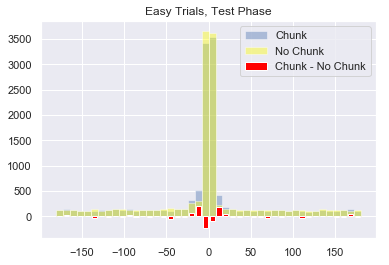

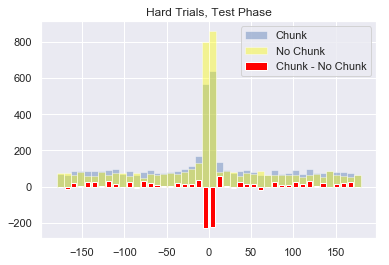

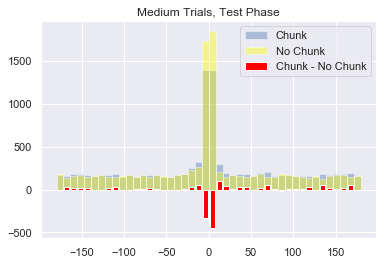

In [16]:
base = "Y:/sir3/results/Ring/2Stripe/decodedrew/contNoHidden/NoIgnore/nonresponse/"
easy2,hard2,med2 = all_files_easyrecall(base)
base = "Y:/sir3_chunk/results/Ring/2Stripe/hybrid/decodedrew/contNoHidden/NoIgnore/nonresponse/"
easy,hard,med = all_files_easyrecall(base)
overlay_hist(easy, easy2, title = 'Easy Trials, Test Phase')
overlay_hist(hard, hard2, title = 'Hard Trials, Test Phase')
overlay_hist(med, med2, title = 'Medium Trials, Test Phase')

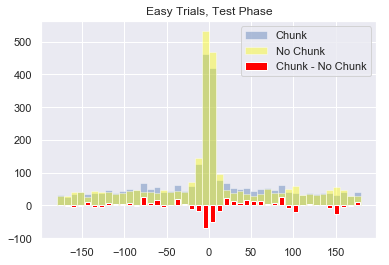

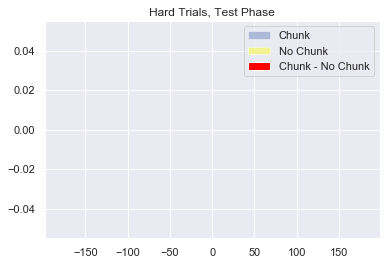

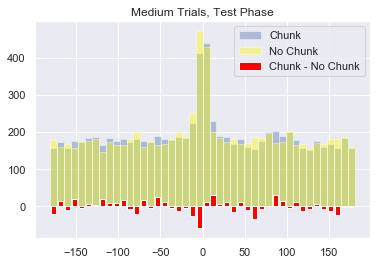

In [15]:
base = "Y:/sir4/results/Ring/2Stripe/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/fillstim/resetstim/clearallstripes/"
easy2,hard2,med2 = all_files_easyrecall(base)
base = "Y:/sir4_chunk/results/Ring/2Stripe/hybrid/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/fillstim/resetstim/clearallstripes/"
easy,hard,med = all_files_easyrecall(base)
overlay_hist(easy, easy2, title = 'Easy Trials, Test Phase')
overlay_hist(hard, hard2, title = 'Hard Trials, Test Phase')
overlay_hist(med, med2, title = 'Medium Trials, Test Phase')

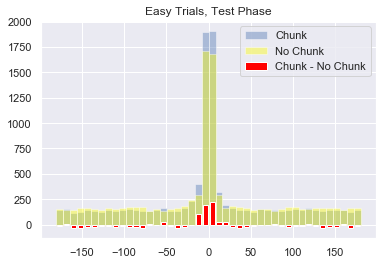

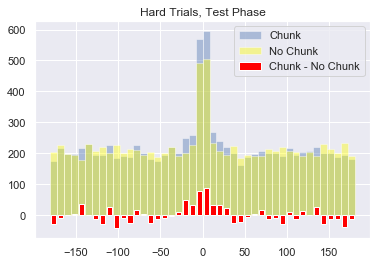

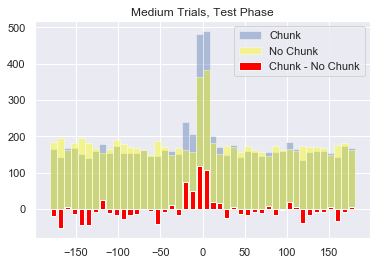

In [14]:
base = "Y:/sir4/results/Ring/2Stripe/decodedrew/cont/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/fixedcode/"
easy2,hard2,med2 = all_files_easyrecall(base)
base = "Y:/sir4_chunk/results/Ring/2Stripe/hybrid/decodedrew/cont/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/fixedcode/"
easy,hard,med = all_files_easyrecall(base)
overlay_hist(easy, easy2, title = 'Easy Trials, Test Phase')
overlay_hist(hard, hard2, title = 'Hard Trials, Test Phase')
overlay_hist(med, med2, title = 'Medium Trials, Test Phase')

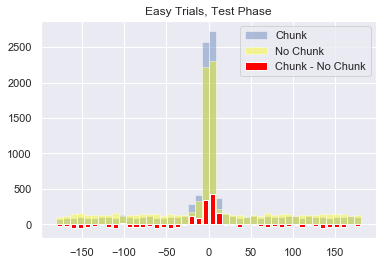

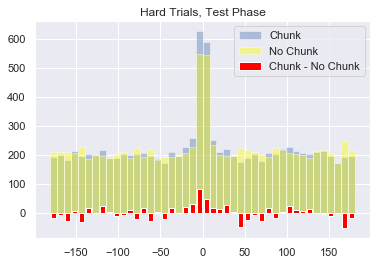

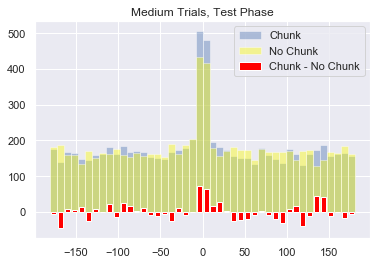

In [13]:
base = "Y:/sir4/results/Ring/2Stripe/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/fixedcode/"
easy2,hard2,med2 = all_files_easyrecall(base)
base = "Y:/sir4_chunk/results/Ring/2Stripe/hybrid/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/fixedcode/"
easy,hard,med = all_files_easyrecall(base)
overlay_hist(easy, easy2, title = 'Easy Trials, Test Phase')
overlay_hist(hard, hard2, title = 'Hard Trials, Test Phase')
overlay_hist(med, med2, title = 'Medium Trials, Test Phase')

In [5]:
base = "Y:/sir4/results/Ring/2Stripe/decodedrew/contNoHidden/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/traintrials/"
easy2,hard2,med2 = all_files_easyrecall(base)

In [11]:
base = "Y:/sir4_chunk/results/Ring/2Stripe/hybrid/decodedrew/contNoHidden/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/traintrials/"
easy,hard,med = all_files_easyrecall(base)

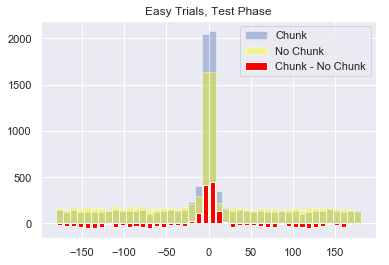

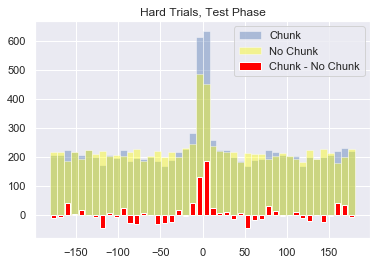

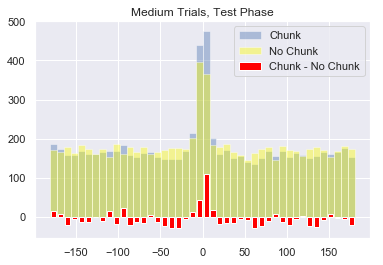

In [12]:
overlay_hist(easy, easy2, title = 'Easy Trials, Test Phase')
overlay_hist(hard, hard2, title = 'Hard Trials, Test Phase')
overlay_hist(med, med2, title = 'Medium Trials, Test Phase')

(array([ 748.,  749.,  744.,  762., 1016.,  975.,  706.,  756.,  754.,
         741.]),
 array([-1.79944264e+02, -1.43956261e+02, -1.07968258e+02, -7.19802547e+01,
        -3.59922516e+01, -4.24854638e-03,  3.59837546e+01,  7.19717576e+01,
         1.07959761e+02,  1.43947764e+02,  1.79935767e+02]),
 <a list of 10 Patch objects>)

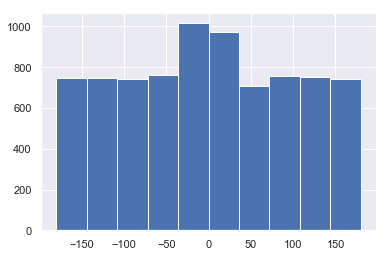

In [9]:
plt.hist(med2)

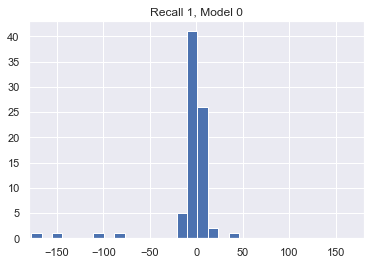

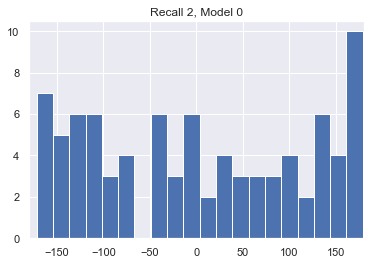

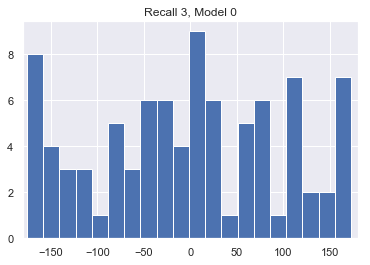

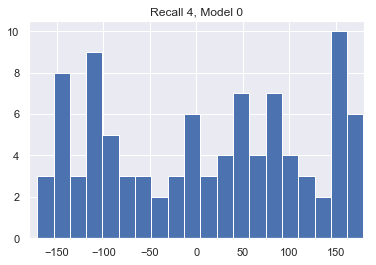

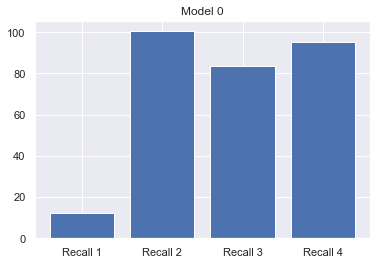

...

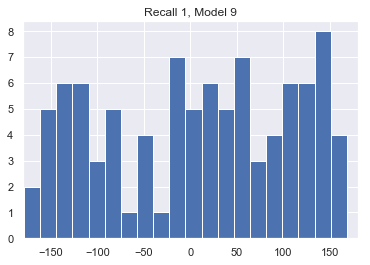

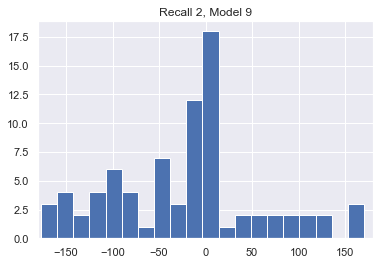

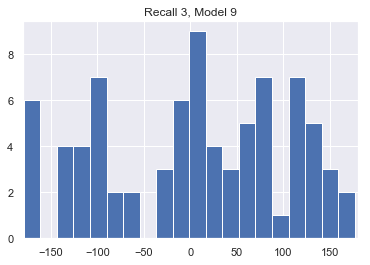

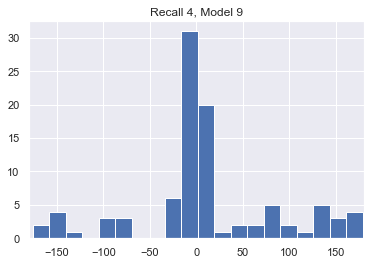

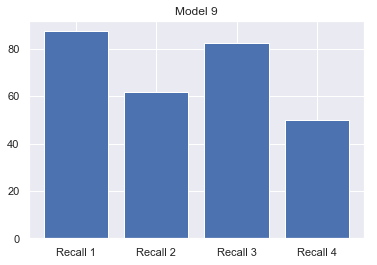

In [13]:
base = "Y:/sir4_chunk/results/Ring/2Stripe/hybrid/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/"
r1,r2,r3,r4 = testrecalltypes(base)

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


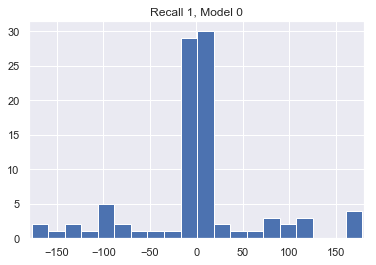

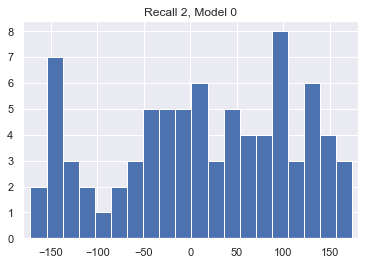

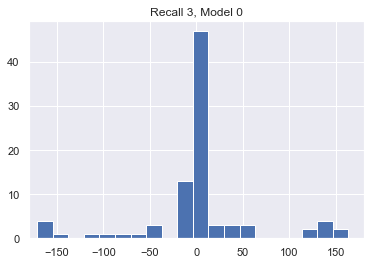

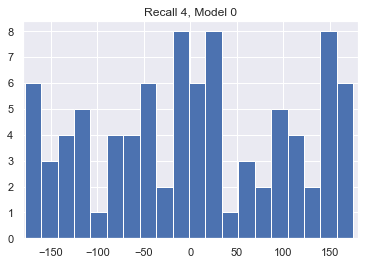

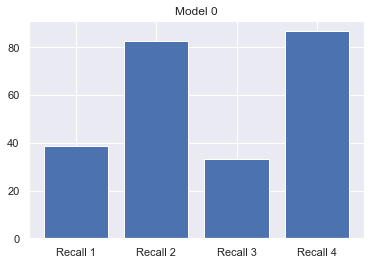

...

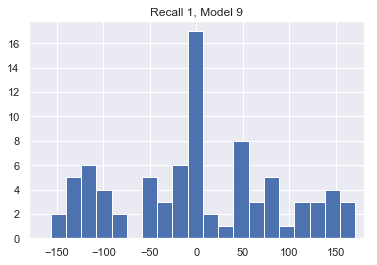

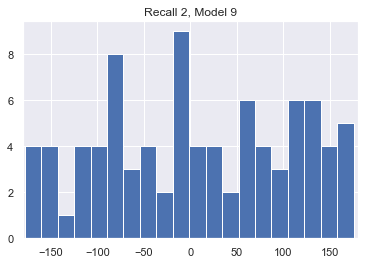

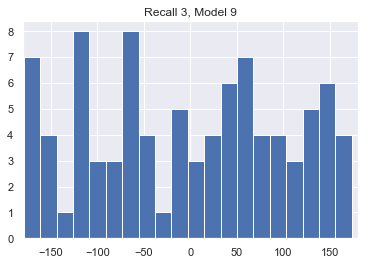

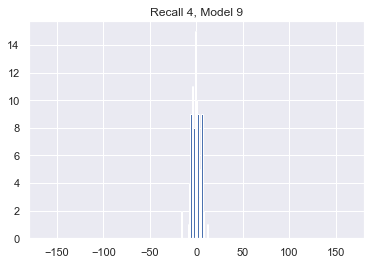

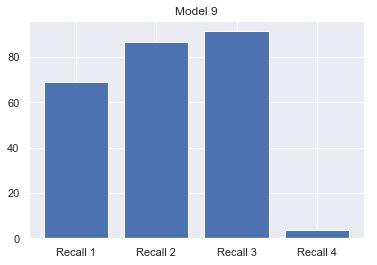

In [11]:
base = "Y:/sir4/results/Ring/2Stripe/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/highinhib/"
r1,r2,r3,r4 = testrecalltypes(base)

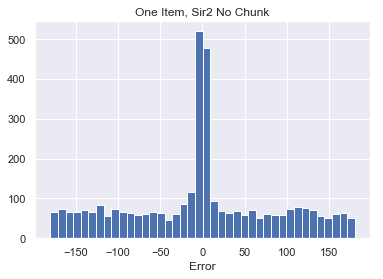

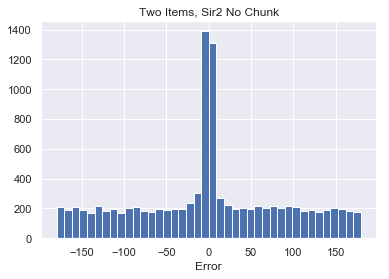

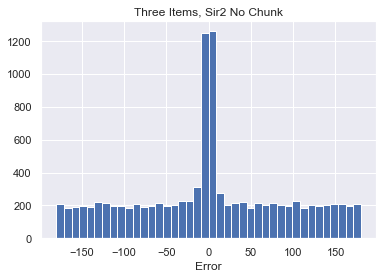

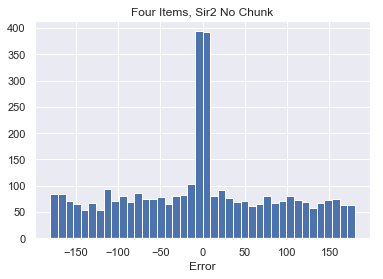

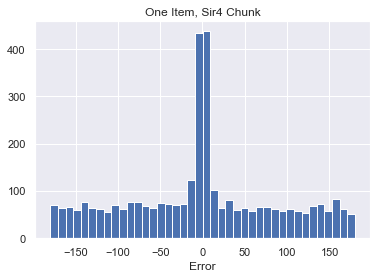

...

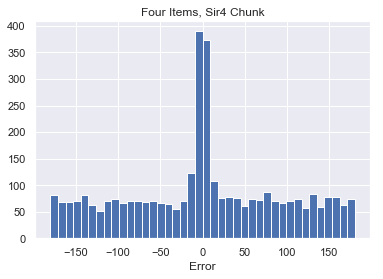

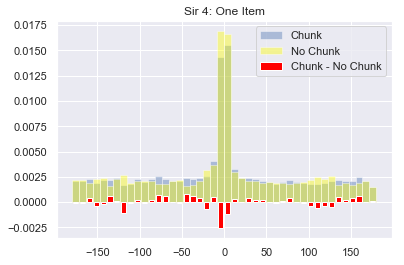

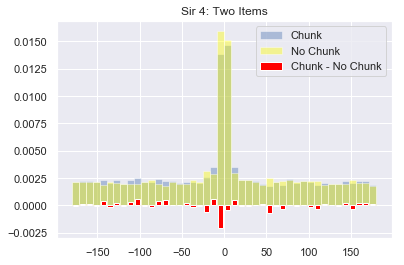

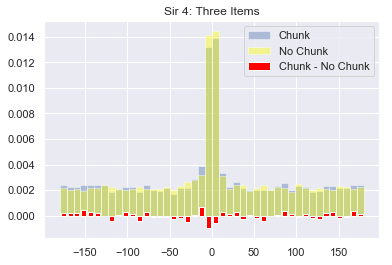

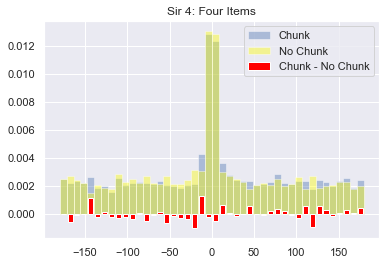

In [9]:
base = "Y:/sir4/results/Ring/2Stripe/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/highinhib/"
one,two,three,four = all_files_numstim(base)
plot_numstim(one,two,three,four, ', Sir2 No Chunk')
base = "Y:/sir4_chunk/results/Ring/2Stripe/hybrid/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/"
one_chunk,two_chunk,three_chunk,four_chunk = all_files_numstim(base)
plot_numstim(one_chunk,two_chunk,three_chunk,four_chunk, ', Sir4 Chunk')
plt.figure()
overlay_hist(one_chunk,one, pl_density = True ,title = 'Sir 4: One Item')
plt.figure()
overlay_hist(two_chunk,two, pl_density = True, title = 'Sir 4: Two Items')
plt.figure()
overlay_hist(three_chunk,three, pl_density = True, title = 'Sir 4: Three Items')
plt.figure()
overlay_hist(four_chunk,four, pl_density = True, title = 'Sir 4: Four Items')

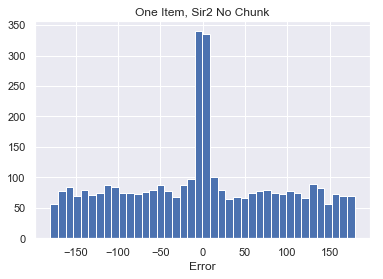

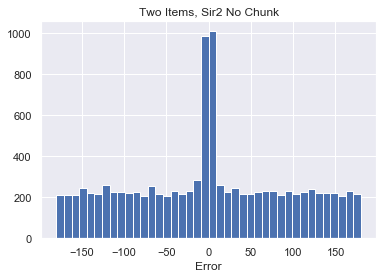

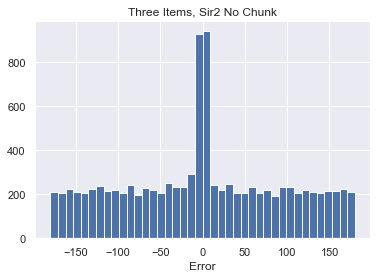

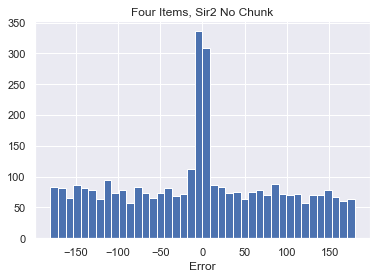

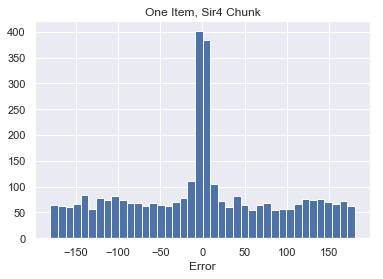

...

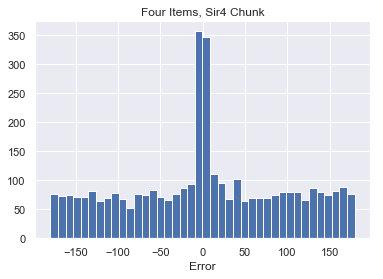

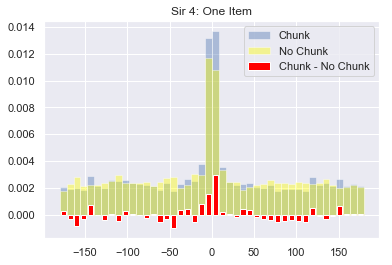

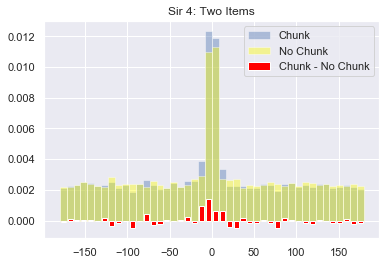

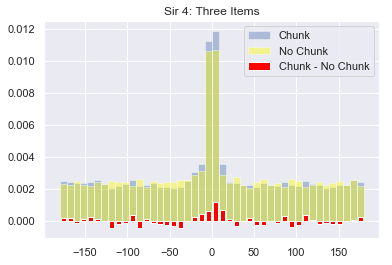

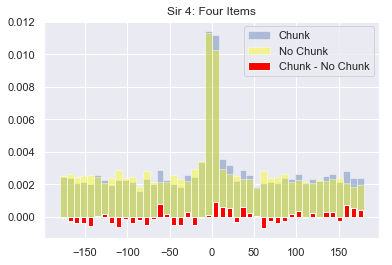

In [10]:
base = "Y:/sir4/results/Ring/2Stripe/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/"
one,two,three,four = all_files_numstim(base)
plot_numstim(one,two,three,four, ', Sir2 No Chunk')
base = "Y:/sir4_chunk/results/Ring/2Stripe/hybrid/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/lowinhib/"
one_chunk,two_chunk,three_chunk,four_chunk = all_files_numstim(base)
plot_numstim(one_chunk,two_chunk,three_chunk,four_chunk, ', Sir4 Chunk')
plt.figure()
overlay_hist(one_chunk,one, pl_density = True ,title = 'Sir 4: One Item')
plt.figure()
overlay_hist(two_chunk,two, pl_density = True, title = 'Sir 4: Two Items')
plt.figure()
overlay_hist(three_chunk,three, pl_density = True, title = 'Sir 4: Three Items')
plt.figure()
overlay_hist(four_chunk,four, pl_density = True, title = 'Sir 4: Four Items')

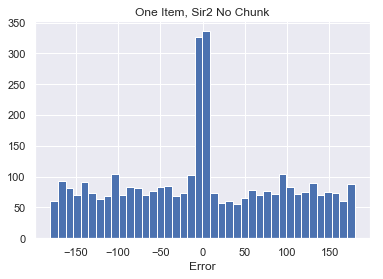

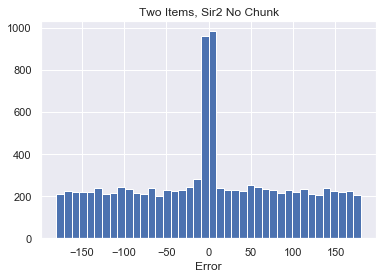

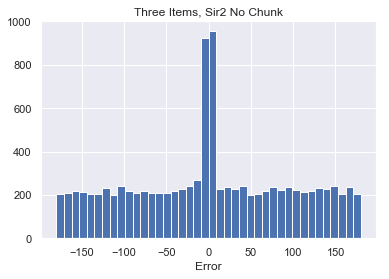

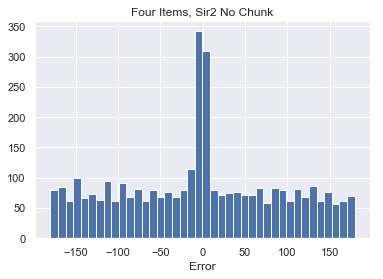

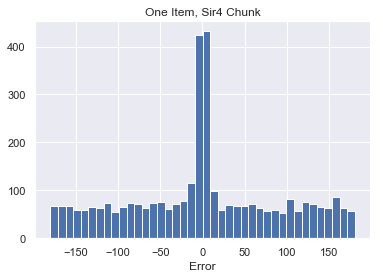

...

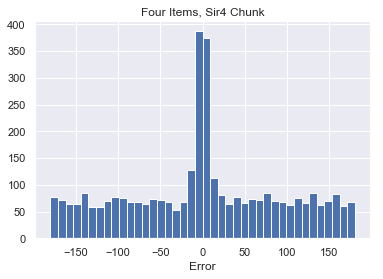

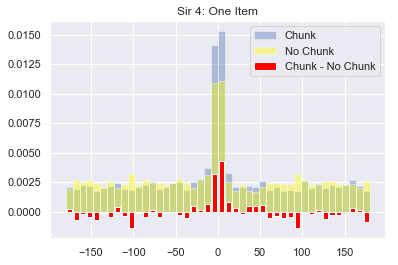

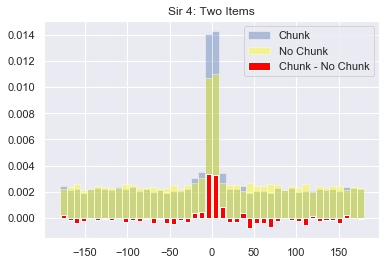

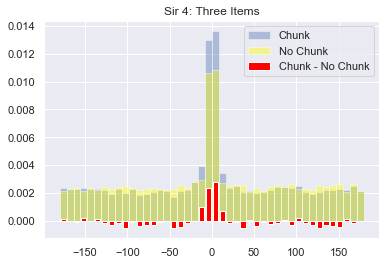

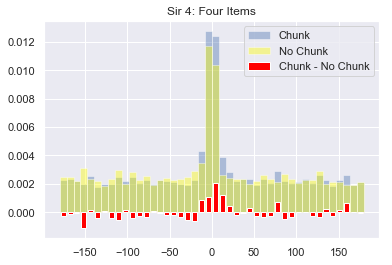

In [7]:
base = "Y:/sir4/results/Ring/2Stripe/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/"
one,two,three,four = all_files_numstim(base)
plot_numstim(one,two,three,four, ', Sir2 No Chunk')
base = "Y:/sir4_chunk/results/Ring/2Stripe/hybrid/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/"
one_chunk,two_chunk,three_chunk,four_chunk = all_files_numstim(base)
plot_numstim(one_chunk,two_chunk,three_chunk,four_chunk, ', Sir4 Chunk')
plt.figure()
overlay_hist(one_chunk,one, pl_density = True ,title = 'Sir 4: One Item')
plt.figure()
overlay_hist(two_chunk,two, pl_density = True, title = 'Sir 4: Two Items')
plt.figure()
overlay_hist(three_chunk,three, pl_density = True, title = 'Sir 4: Three Items')
plt.figure()
overlay_hist(four_chunk,four, pl_density = True, title = 'Sir 4: Four Items')

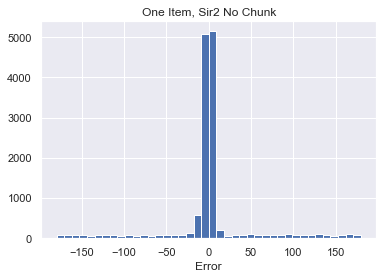

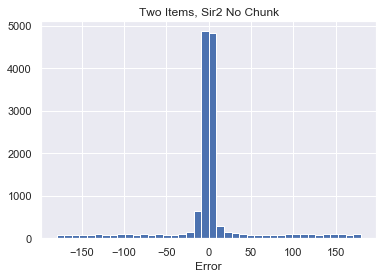

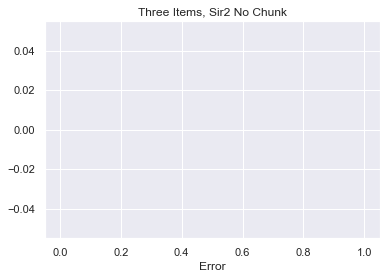

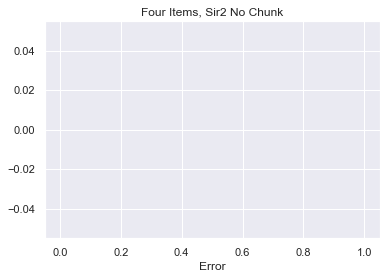

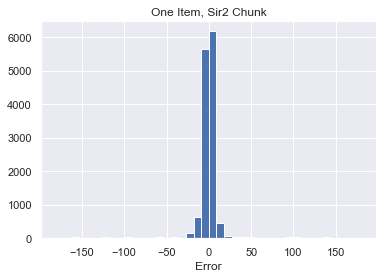

...

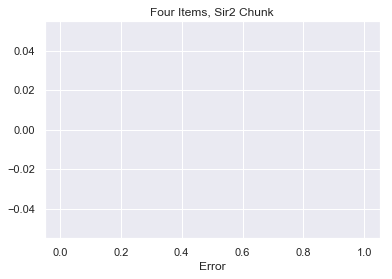

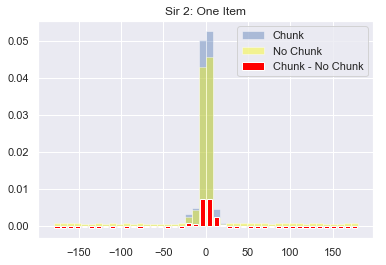

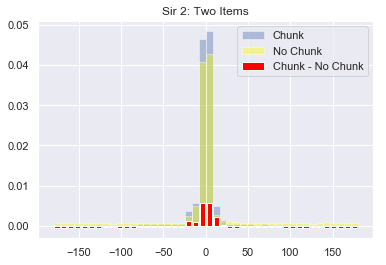

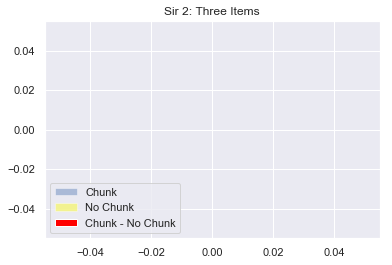

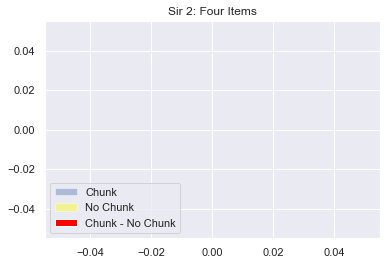

In [27]:
base = "Y:/sir2_new/results/Ring/2Stripe/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/"
one,two,three,four = all_files_numstim(base)
plot_numstim(one,two,three,four, ', Sir2 No Chunk')
base = "Y:/sir2_chunk/results/Ring/2Stripe/hybrid/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/"
one_chunk,two_chunk,three_chunk,four_chunk = all_files_numstim(base)
plot_numstim(one_chunk,two_chunk,three_chunk,four_chunk, ', Sir2 Chunk')
plt.figure()
overlay_hist(one_chunk,one, pl_density = True ,title = 'Sir 2: One Item')
plt.figure()
overlay_hist(two_chunk,two, pl_density = True, title = 'Sir 2: Two Items')
plt.figure()
overlay_hist(three_chunk,three, pl_density = True, title = 'Sir 2: Three Items')
plt.figure()
overlay_hist(four_chunk,four, pl_density = True, title = 'Sir 2: Four Items')

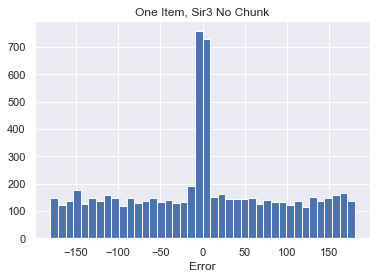

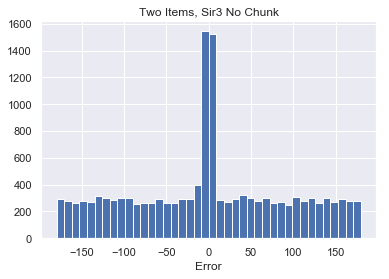

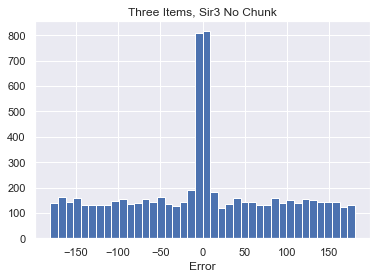

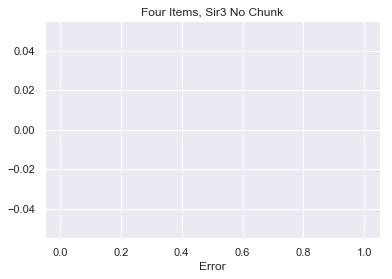

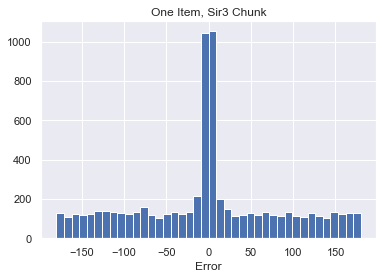

...

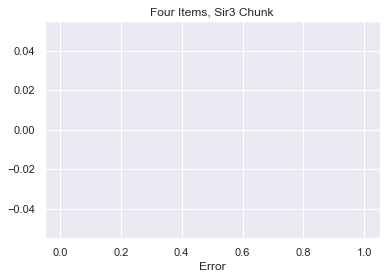

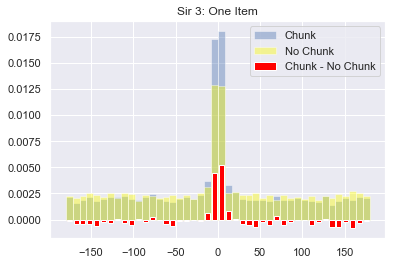

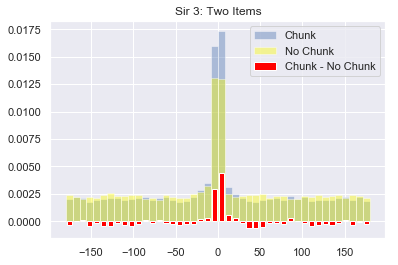

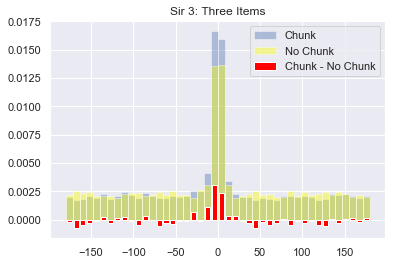

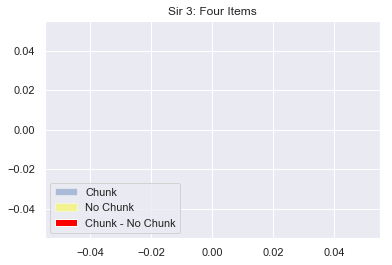

In [25]:
base = "Y:/sir3/results/Ring/2Stripe/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/"
one,two,three,four = all_files_numstim(base)
plot_numstim(one,two,three,four, ', Sir3 No Chunk')
base = "Y:/sir3_chunk/results/Ring/2Stripe/hybrid/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/"
one_chunk,two_chunk,three_chunk,four_chunk = all_files_numstim(base)
plot_numstim(one_chunk,two_chunk,three_chunk,four_chunk, ', Sir3 Chunk')
plt.figure()
overlay_hist(one_chunk,one, pl_density = True ,title = 'Sir 3: One Item')
plt.figure()
overlay_hist(two_chunk,two, pl_density = True, title = 'Sir 3: Two Items')
plt.figure()
overlay_hist(three_chunk,three, pl_density = True, title = 'Sir 3: Three Items')
plt.figure()
overlay_hist(four_chunk,four, pl_density = True, title = 'Sir 3: Four Items')

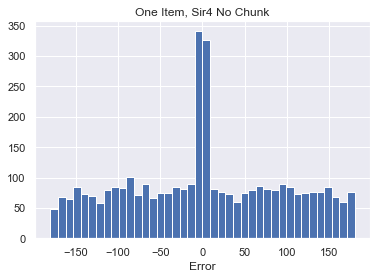

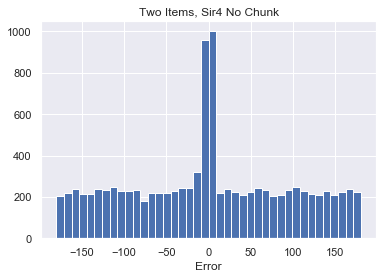

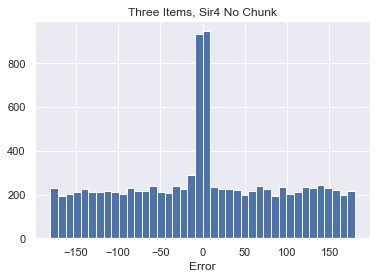

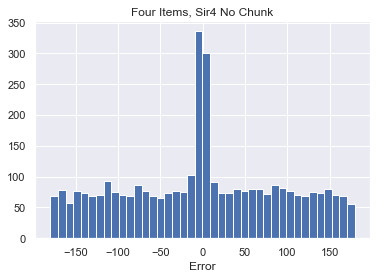

In [18]:
base = "Y:/sir4/results/Ring/2Stripe/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/traintrials/"
one,two,three,four = all_files_numstim(base)
plot_numstim(one,two,three,four, ', Sir4 No Chunk')

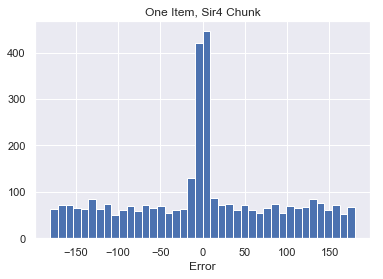

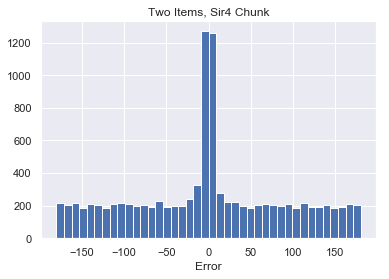

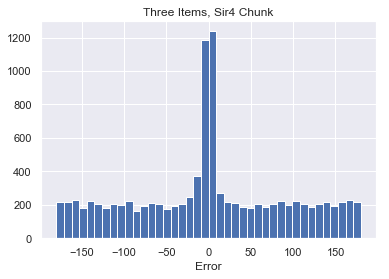

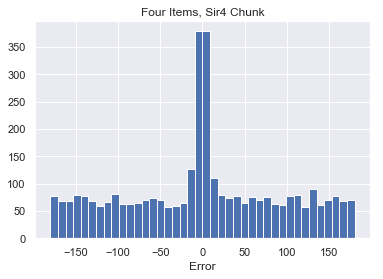

In [6]:
base = "Y:/sir4_chunk/results/Ring/2Stripe/hybrid/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/traintrials/"
one_chunk,two_chunk,three_chunk,four_chunk = all_files_numstim(base)
plot_numstim(one_chunk,two_chunk,three_chunk,four_chunk, ', Sir4 Chunk')

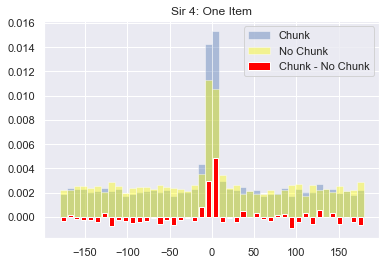

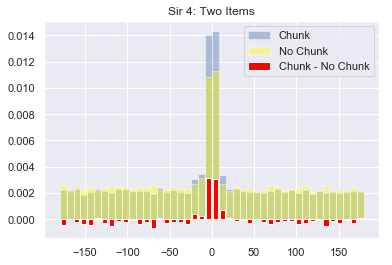

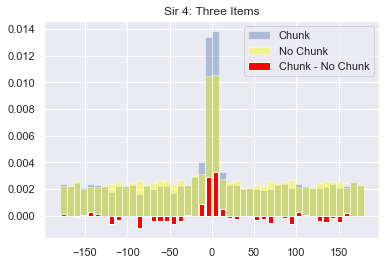

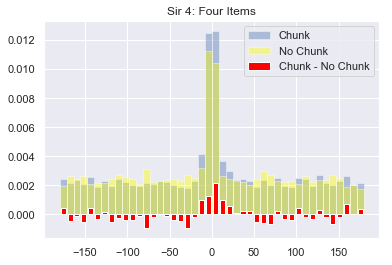

In [10]:
overlay_hist(one_chunk,one, pl_density = True ,title = 'Sir 4: One Item')
overlay_hist(two_chunk,two, pl_density = True, title = 'Sir 4: Two Items')
overlay_hist(three_chunk,three, pl_density = True, title = 'Sir 4: Three Items')
overlay_hist(four_chunk,four, pl_density = True, title = 'Sir 4: Four Items')

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


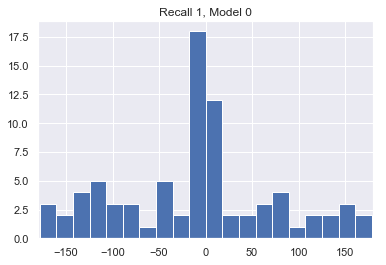

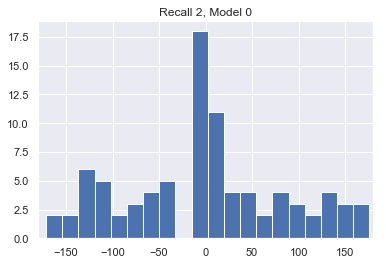

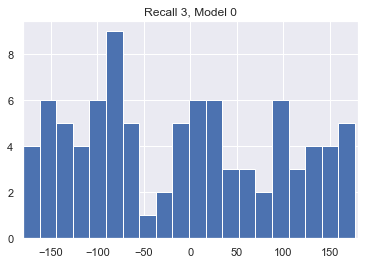

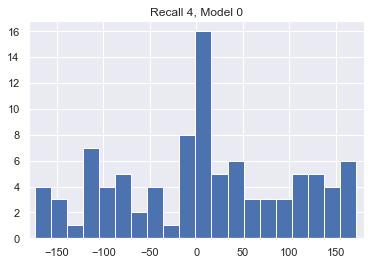

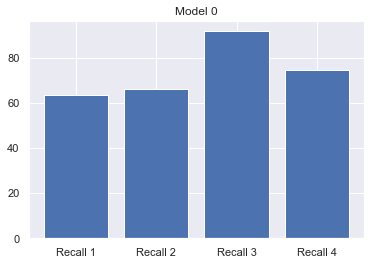

...

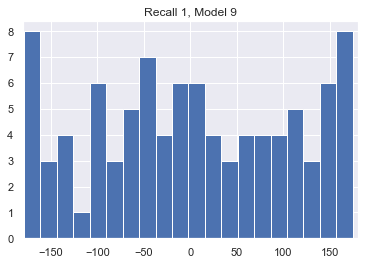

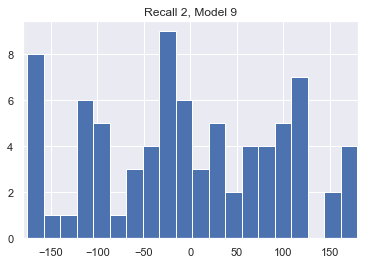

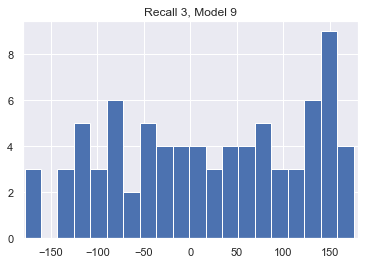

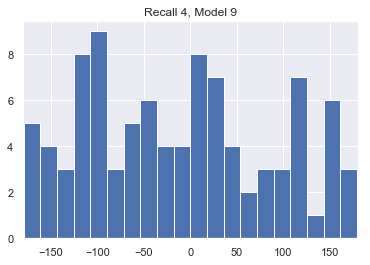

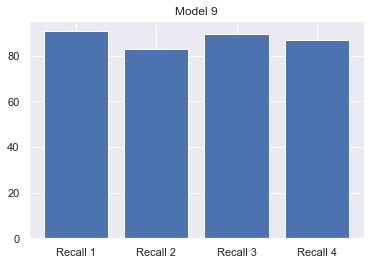

In [4]:
base = "Y:/sir4/results/Ring/2Stripe/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/traintrials/"
r1,r2,r3,r4 = testrecalltypes(base)

In [15]:
model = 2
total = r1[model]+r2[model]+r3[model]+r4[model]
r1[model]/total, r2[model]/total, r3[model]/total, r4[model]/total

(0.2492836676217765,
 0.22349570200573066,
 0.2664756446991404,
 0.2607449856733524)

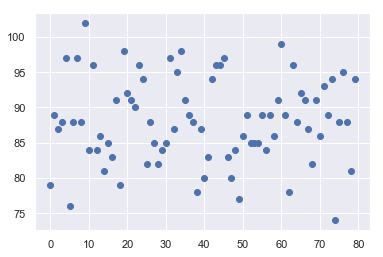

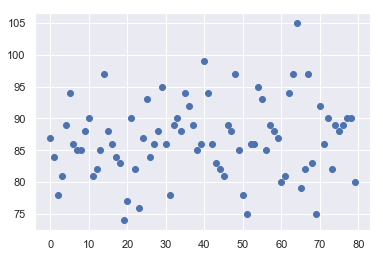

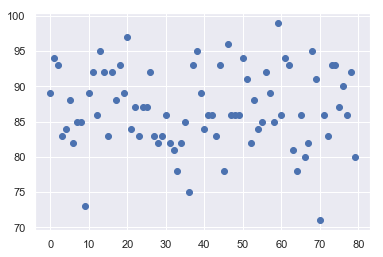

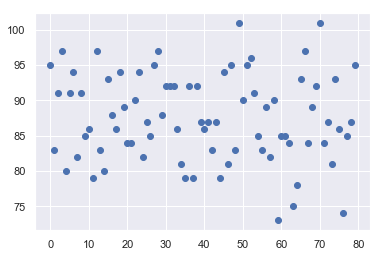

In [11]:
plt.scatter(range(80),r1)
plt.figure()
plt.scatter(range(80),r2)
plt.figure()
plt.scatter(range(80),r3)
plt.figure()
plt.scatter(range(80),r4)

In [58]:
base = "Y:/sir4/results/Ring/2Stripe/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/traintrials/"
easy2,hard2,med2 = all_files_easyrecall(base)

In [59]:
base = "Y:/sir4_chunk/results/Ring/2Stripe/hybrid/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/traintrials/"
easy2chunk,hard2chunk,med2chunk = all_files_easyrecall(base)

In [8]:
total = len(easy2chunk)+len(med2chunk)+len(hard2chunk)
print(len(easy2chunk)/total)
print(len(med2chunk)/total)
print(len(hard2chunk)/total)

0.3693332378428704
0.4090095251736733
0.22165723698345627


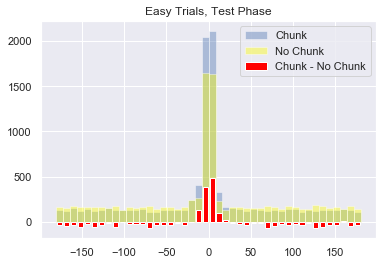

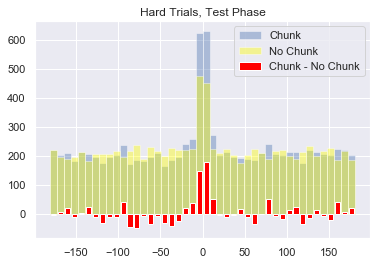

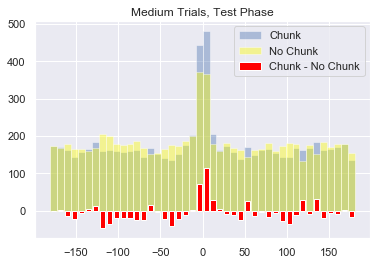

In [60]:
overlay_hist(easy2chunk, easy2, title = 'Easy Trials, Test Phase')
overlay_hist(hard2chunk, hard2, title = 'Hard Trials, Test Phase')
overlay_hist(med2chunk, med2, title = 'Medium Trials, Test Phase')

In [38]:
total = len(easy2chunk)+len(hard2chunk)+len(med2chunk)

(array([0.00256164, 0.00265562, 0.00270864, 0.00270382, 0.00355689,
        0.00329904, 0.00261224, 0.00256887, 0.00260983, 0.00250139]),
 array([-1.79997761e+02, -1.43998018e+02, -1.07998275e+02, -7.19985315e+01,
        -3.59987882e+01,  9.55049123e-04,  3.60006983e+01,  7.20004416e+01,
         1.08000185e+02,  1.43999928e+02,  1.79999671e+02]),
 <a list of 10 Patch objects>)

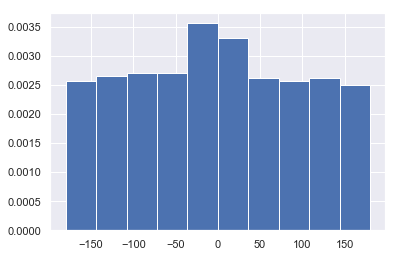

In [37]:
plt.hist(med2, density = True)

(array([0.00264508, 0.00260403, 0.00280014, 0.00259491, 0.00347965,
        0.00343404, 0.00249002, 0.00246266, 0.00256299, 0.00271805]),
 array([-1.79996107e+02, -1.44013973e+02, -1.08031840e+02, -7.20497059e+01,
        -3.60675722e+01, -8.54384168e-02,  3.58966953e+01,  7.18788291e+01,
         1.07860963e+02,  1.43843097e+02,  1.79825230e+02]),
 <a list of 10 Patch objects>)

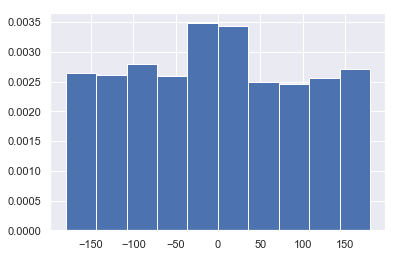

In [36]:
plt.hist(hard2, density= True)

Text(0.5, 1.0, 'No Chunk, Hard Trials, Test Phase')

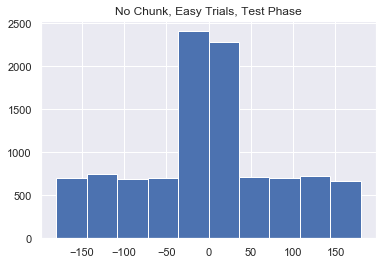

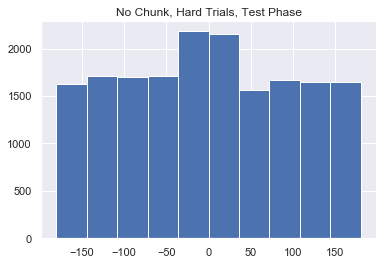

In [19]:
plt.hist(easy2)
plt.title('No Chunk, Easy Trials, Test Phase')
plt.figure()
plt.hist(hard2)
plt.title('No Chunk, Hard Trials, Test Phase')

In [15]:
base = "Y:/sir4_chunk/results/Ring/2Stripe/hybrid/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/traintrials/"
easy2chunk,hard2chunk,med2chunk = all_files_easyrecall(base)

Text(0.5, 1.0, 'Chunk, Hard Trials, Test Phase')

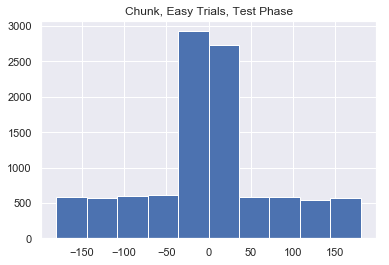

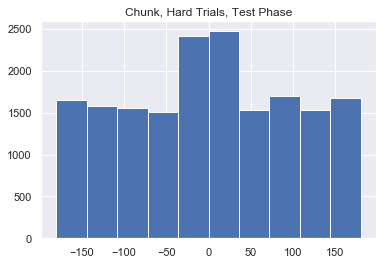

In [17]:
plt.hist(easy2chunk)
plt.title('Chunk, Easy Trials, Test Phase')
plt.figure()
plt.hist(hard2chunk)
plt.title('Chunk, Hard Trials, Test Phase')

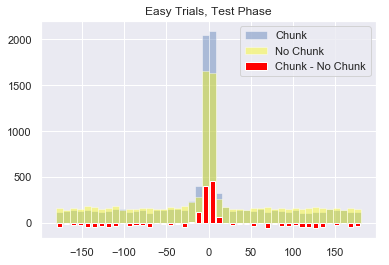

In [24]:
overlay_hist(easy2chunk, easy2, title = 'Easy Trials, Test Phase')

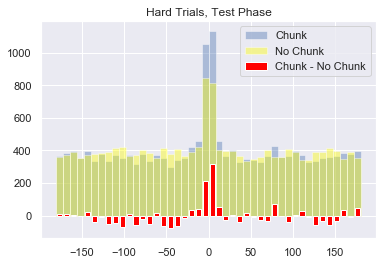

In [26]:
overlay_hist(hard2chunk, hard2, title = 'Hard Trials, Test Phase')

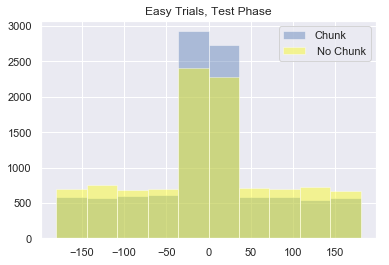

In [20]:
plt.hist(easy2chunk, alpha = 0.4)
plt.hist(easy2, alpha = 0.4, color = "yellow")
plt.title('Easy Trials, Test Phase')
plt.legend(['Chunk', ' No Chunk'])
plt.show()

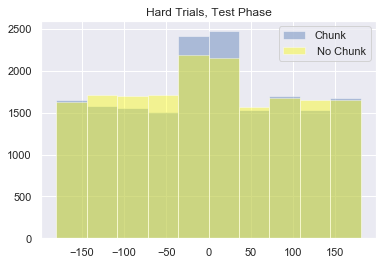

In [22]:
plt.hist(hard2chunk, alpha = 0.4)
plt.hist(hard2, alpha = 0.4, color = "yellow")
plt.title('Hard Trials, Test Phase')
plt.legend(['Chunk', ' No Chunk'])
plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


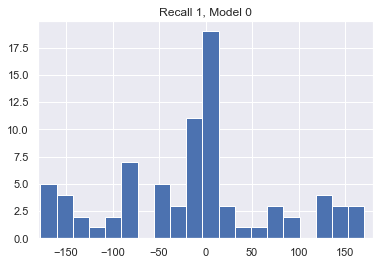

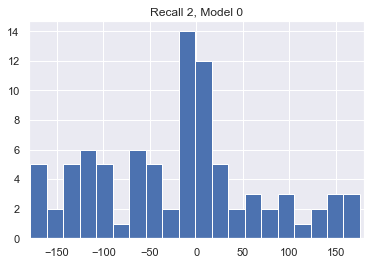

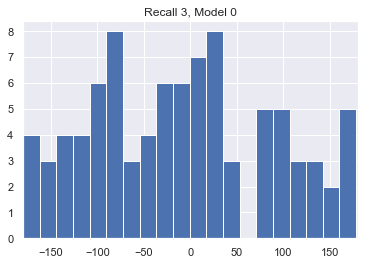

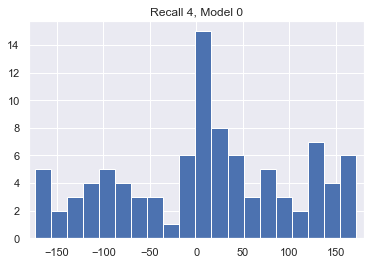

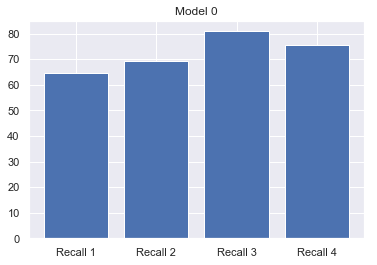

...

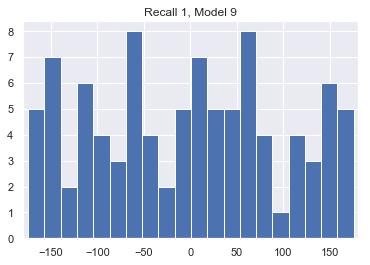

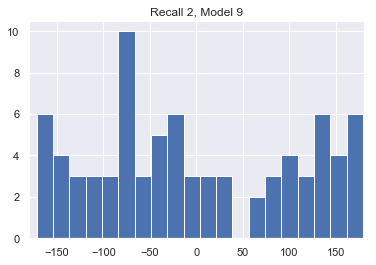

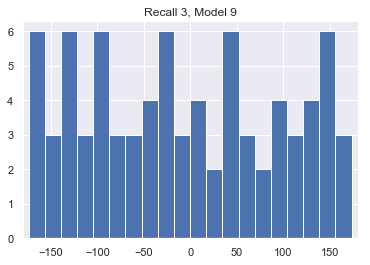

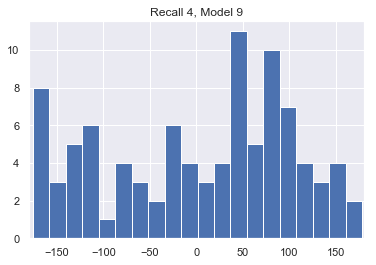

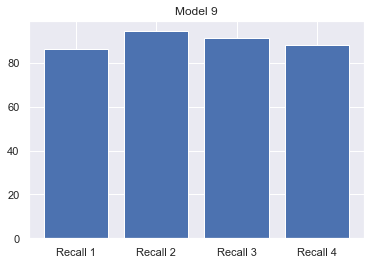

In [10]:
base = "Y:/sir4/results/Ring/2Stripe/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/traintrials/"
df = testrecalltypes(base)
# df_recall = df_chosen_epoch.loc['True']
# easytrials,hardtrials,easy,hard = easy_recall(df_chosen_epoch,df_recall)

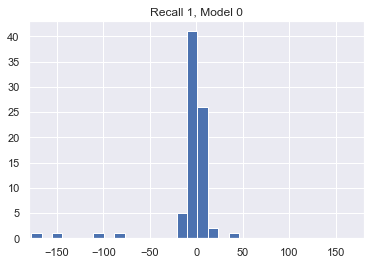

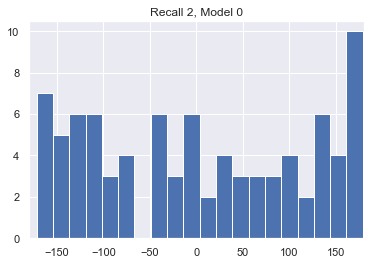

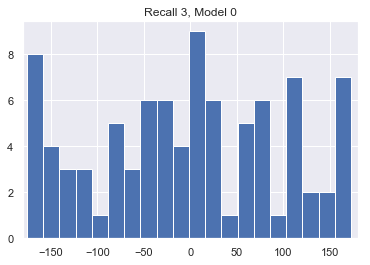

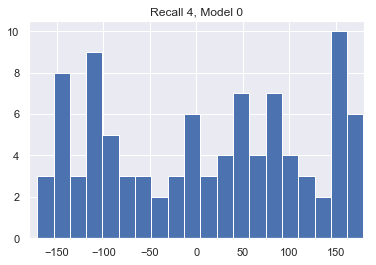

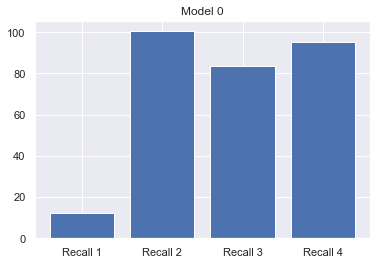

...

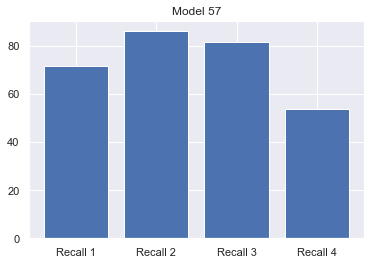

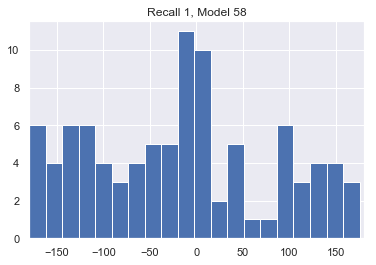

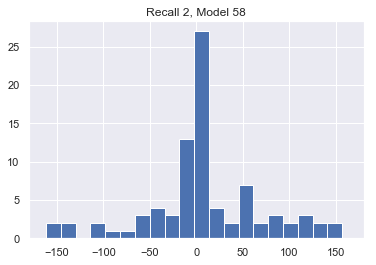

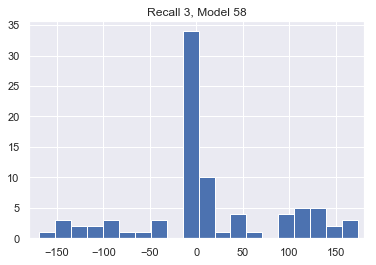

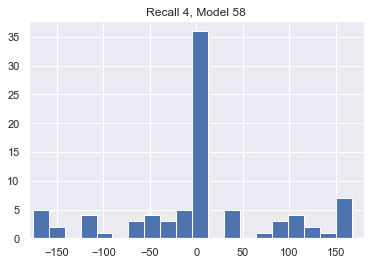

In [ ]:
base = "Y:/sir4_chunk/results/Ring/2Stripe/hybrid/decodedrew/contNoStimLoc/NoIgnore/nonresponse/OneR/defaults/VmNoise/VarNonFixed/traintrials/"
df = testrecalltypes(base)
# df_recall = df_chosen_epoch.loc['True']
# easytrials,hardtrials,easy,hard = easy_recall(df_chosen_epoch,df_recall)